# Optimized Cervical Cancer Image Preprocessing Pipeline Analysis

## Project Overview
This notebook provides a comprehensive analysis of preprocessing methods for cervical cancer cell classification using cropped cell images. The analysis focuses on determining the optimal preprocessing pipeline through systematic evaluation of three core techniques and their combinations.

## Preprocessing Methods Under Investigation
1. **PMD (Perona-Malik Diffusion)** - Edge-preserving noise reduction using anisotropic diffusion
2. **CLAHE (Contrast Limited Adaptive Histogram Equalization)** - Adaptive contrast enhancement for improved visibility
3. **NLM (Non-Local Means)** - Advanced denoising algorithm for noise reduction while preserving structures

## Analysis Framework
- **Dataset**: Cropped cell images from 5 cervical cancer cell categories
- **Combinations**: 12 different preprocessing pipelines (3 single + 3 paired + 6 triple combinations)
- **Evaluation**: Quantitative metrics (SSIM, PSNR, Contrast Enhancement, Edge Preservation)
- **Sample Size**: 4 representative images per cell category (20 total images)

## Cell Categories
- im_Dyskeratotic
- im_Koilocytotic  
- im_Metaplastic
- im_Parabasal
- im_Superficial-Intermediate

## Expected Outputs
- Optimized hyperparameters for each preprocessing method
- Performance ranking of all 12 preprocessing combinations
- Visual comparisons and quality metrics analysis
- Final recommendation for optimal preprocessing pipeline

## Library Imports and Configuration

In [32]:
import os
import cv2
import numpy as np
import matplotlib.pyplot as plt
from pathlib import Path
from tqdm import tqdm
import pandas as pd
import time
import warnings
from skimage.metrics import structural_similarity as ssim
from sklearn.metrics import mean_squared_error
import seaborn as sns
from datetime import datetime
import json

# Suppress warnings for cleaner output
warnings.filterwarnings('ignore')

# Project Configuration
BASE_DIR = Path(r"c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix")
RAW_DATASET_PATH = BASE_DIR / "Dataset" / "Raw Dataset" / "SipakMed Dataset"
OUTPUT_DIR = BASE_DIR / "Dataset" / "Optimized Preprocessing Analysis"

# Create output directory structure
OUTPUT_DIR.mkdir(exist_ok=True)
(OUTPUT_DIR / "visualizations").mkdir(exist_ok=True)
(OUTPUT_DIR / "processed_samples").mkdir(exist_ok=True)
(OUTPUT_DIR / "metrics").mkdir(exist_ok=True)

# Processing Configuration
TARGET_SIZE = (256, 256)  # Optimized size for cropped cells
SAMPLES_PER_CLASS = 4

# Cell Categories
CLASS_NAMES = [
    'im_Dyskeratotic',
    'im_Koilocytotic', 
    'im_Metaplastic',
    'im_Parabasal',
    'im_Superficial-Intermediate'
]

# Set up matplotlib for better visualizations
plt.rcParams['figure.figsize'] = (12, 8)
plt.rcParams['figure.dpi'] = 100

print("Configuration Setup Complete")
print(f"Base Directory: {BASE_DIR}")
print(f"Dataset Path: {RAW_DATASET_PATH}")
print(f"Output Directory: {OUTPUT_DIR}")
print(f"Target Image Size: {TARGET_SIZE}")
print(f"Samples per Class: {SAMPLES_PER_CLASS}")
print(f"Total Classes: {len(CLASS_NAMES)}")
print(f"Analysis Timestamp: {datetime.now().strftime('%Y-%m-%d %H:%M:%S')}")

Configuration Setup Complete
Base Directory: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix
Dataset Path: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Raw Dataset\SipakMed Dataset
Output Directory: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis
Target Image Size: (256, 256)
Samples per Class: 4
Total Classes: 5
Analysis Timestamp: 2025-08-14 16:21:32


## Optimized Preprocessing Functions

The following functions implement the three core preprocessing methods with optimized hyperparameters determined through extensive experimentation for cervical cancer cell images.

In [35]:
def apply_pmd_filter(image):
    """
    Apply Perona-Malik Diffusion for edge-preserving smoothing.
    Optimized parameters for cervical cancer cells:
    - d=7: Smaller neighborhood for finer detail preservation
    - sigmaColor=60: Reduced to preserve cellular structures
    - sigmaSpace=60: Balanced spatial filtering
    """
    try:
        if len(image.shape) == 3:
            # Convert to float32 for better precision
            img_float = image.astype(np.float32) / 255.0
            filtered = cv2.bilateralFilter(img_float, d=7, sigmaColor=60, sigmaSpace=60)
            return (filtered * 255).astype(np.uint8)
        else:
            img_float = image.astype(np.float32) / 255.0
            filtered = cv2.bilateralFilter(img_float, d=7, sigmaColor=60, sigmaSpace=60)
            return (filtered * 255).astype(np.uint8)
    except Exception as e:
        print(f"PMD filtering failed: {e}")
        return image

def apply_clahe(image):
    """
    Apply Contrast Limited Adaptive Histogram Equalization.
    Optimized parameters for cervical cancer cells:
    - clipLimit=2.5: Increased for better contrast in cellular details
    - tileGridSize=(6,6): Smaller tiles for localized enhancement
    """
    try:
        if len(image.shape) == 3:
            # Convert to LAB color space for better processing
            lab = cv2.cvtColor(image, cv2.COLOR_BGR2LAB)
            l_channel = lab[:, :, 0]
            
            clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(6, 6))
            enhanced_l = clahe.apply(l_channel)
            
            lab[:, :, 0] = enhanced_l
            enhanced_image = cv2.cvtColor(lab, cv2.COLOR_LAB2BGR)
            return enhanced_image
        else:
            clahe = cv2.createCLAHE(clipLimit=2.5, tileGridSize=(6, 6))
            return clahe.apply(image)
    except Exception as e:
        print(f"CLAHE processing failed: {e}")
        return image

def apply_nlm_denoising(image):
    """
    Apply Non-Local Means denoising.
    Optimized parameters for cervical cancer cells:
    - h=8: Reduced for better structure preservation
    - templateWindowSize=5: Smaller template for finer details
    - searchWindowSize=15: Reduced search area for efficiency
    """
    try:
        if len(image.shape) == 3:
            denoised = cv2.fastNlMeansDenoisingColored(
                image, None, h=8, hColor=8, 
                templateWindowSize=5, searchWindowSize=15
            )
        else:
            denoised = cv2.fastNlMeansDenoising(
                image, None, h=8, 
                templateWindowSize=5, searchWindowSize=15
            )
        return denoised
    except Exception as e:
        print(f"NLM denoising failed: {e}")
        return image

# Test preprocessing functions
print("Preprocessing functions defined with optimized hyperparameters:")
print("✓ PMD Filter: d=7, sigmaColor=60, sigmaSpace=60")
print("✓ CLAHE: clipLimit=2.5, tileGridSize=(6,6)")
print("✓ NLM Denoising: h=8, templateWindowSize=5, searchWindowSize=15")

Preprocessing functions defined with optimized hyperparameters:
✓ PMD Filter: d=7, sigmaColor=60, sigmaSpace=60
✓ CLAHE: clipLimit=2.5, tileGridSize=(6,6)
✓ NLM Denoising: h=8, templateWindowSize=5, searchWindowSize=15


## Quality Assessment Metrics

Advanced metrics for evaluating preprocessing effectiveness on cervical cancer cell images.

In [31]:
def calculate_comprehensive_metrics(original, processed):
    """
    Calculate comprehensive quality metrics for preprocessing evaluation.
    
    Returns:
        dict: Dictionary containing multiple quality assessment metrics
    """
    metrics = {}
    
    try:
        # Convert to grayscale for metric calculations
        if len(original.shape) == 3:
            original_gray = cv2.cvtColor(original, cv2.COLOR_BGR2GRAY)
            processed_gray = cv2.cvtColor(processed, cv2.COLOR_BGR2GRAY)
        else:
            original_gray = original
            processed_gray = processed
        
        # 1. Structural Similarity Index (SSIM) - measures structural preservation
        metrics['SSIM'] = ssim(original_gray, processed_gray, data_range=255)
        
        # 2. Peak Signal-to-Noise Ratio (PSNR) - measures signal quality
        mse = np.mean((original_gray.astype(float) - processed_gray.astype(float)) ** 2)
        if mse == 0:
            metrics['PSNR'] = 100.0  # Perfect match
        else:
            metrics['PSNR'] = 20 * np.log10(255.0 / np.sqrt(mse))
        
        # 3. Contrast Enhancement Ratio - measures contrast improvement
        original_std = np.std(original_gray)
        processed_std = np.std(processed_gray)
        metrics['Contrast_Enhancement'] = processed_std / original_std if original_std > 0 else 1.0
        
        # 4. Edge Preservation Index - measures edge retention
        original_edges = cv2.Canny(original_gray, 50, 150)
        processed_edges = cv2.Canny(processed_gray, 50, 150)
        edge_correlation = np.corrcoef(original_edges.flatten(), processed_edges.flatten())[0, 1]
        metrics['Edge_Preservation'] = edge_correlation if not np.isnan(edge_correlation) else 0.0
        
        # 5. Noise Reduction Ratio - measures denoising effectiveness
        original_noise = np.std(cv2.Laplacian(original_gray, cv2.CV_64F))
        processed_noise = np.std(cv2.Laplacian(processed_gray, cv2.CV_64F))
        metrics['Noise_Reduction'] = original_noise / processed_noise if processed_noise > 0 else 1.0
        
        # 6. Detail Preservation Index - measures fine detail retention
        original_detail = np.mean(cv2.Sobel(original_gray, cv2.CV_64F, 1, 1, ksize=3)**2)
        processed_detail = np.mean(cv2.Sobel(processed_gray, cv2.CV_64F, 1, 1, ksize=3)**2)
        metrics['Detail_Preservation'] = processed_detail / original_detail if original_detail > 0 else 1.0
        
        # 7. Composite Score - weighted average of normalized metrics
        weights = {
            'SSIM': 0.25,
            'PSNR': 0.15, 
            'Contrast_Enhancement': 0.20,
            'Edge_Preservation': 0.20,
            'Noise_Reduction': 0.10,
            'Detail_Preservation': 0.10
        }
        
        # Normalize metrics to 0-1 scale
        ssim_norm = metrics['SSIM']  # Already 0-1
        psnr_norm = min(metrics['PSNR'] / 40.0, 1.0)  # Normalize to 40dB max
        contrast_norm = max(0, 1.0 - abs(metrics['Contrast_Enhancement'] - 1.2) / 1.2)  # Optimal around 1.2
        edge_norm = (metrics['Edge_Preservation'] + 1) / 2.0  # -1 to 1 becomes 0 to 1
        noise_norm = min(metrics['Noise_Reduction'] / 2.0, 1.0)  # Normalize to 2x max
        detail_norm = min(metrics['Detail_Preservation'], 1.0)  # Cap at 1.0
        
        metrics['Composite_Score'] = (
            weights['SSIM'] * ssim_norm +
            weights['PSNR'] * psnr_norm +
            weights['Contrast_Enhancement'] * contrast_norm +
            weights['Edge_Preservation'] * edge_norm +
            weights['Noise_Reduction'] * noise_norm +
            weights['Detail_Preservation'] * detail_norm
        )
        
    except Exception as e:
        print(f"Error calculating metrics: {e}")
        metrics = {
            'SSIM': 0.0, 'PSNR': 0.0, 'Contrast_Enhancement': 1.0,
            'Edge_Preservation': 0.0, 'Noise_Reduction': 1.0,
            'Detail_Preservation': 1.0, 'Composite_Score': 0.0
        }
    
    return metrics

print("Comprehensive quality assessment metrics defined:")
print("✓ SSIM (Structural Similarity)")
print("✓ PSNR (Peak Signal-to-Noise Ratio)")
print("✓ Contrast Enhancement Ratio")
print("✓ Edge Preservation Index")
print("✓ Noise Reduction Ratio")
print("✓ Detail Preservation Index")
print("✓ Composite Score (Weighted Average)")

Comprehensive quality assessment metrics defined:
✓ SSIM (Structural Similarity)
✓ PSNR (Peak Signal-to-Noise Ratio)
✓ Contrast Enhancement Ratio
✓ Edge Preservation Index
✓ Noise Reduction Ratio
✓ Detail Preservation Index
✓ Composite Score (Weighted Average)


## Preprocessing Combinations Framework

Defining all 12 preprocessing combinations for comprehensive analysis.

In [22]:
# Define all 12 preprocessing combinations
PREPROCESSING_COMBINATIONS = [
    # Single methods (3)
    {'name': 'PMD_Only', 'methods': ['PMD'], 'description': 'Perona-Malik Diffusion only'},
    {'name': 'CLAHE_Only', 'methods': ['CLAHE'], 'description': 'CLAHE enhancement only'},
    {'name': 'NLM_Only', 'methods': ['NLM'], 'description': 'Non-Local Means denoising only'},
    
    # Two methods combined (3)
    {'name': 'PMD_CLAHE', 'methods': ['PMD', 'CLAHE'], 'description': 'PMD followed by CLAHE'},
    {'name': 'PMD_NLM', 'methods': ['PMD', 'NLM'], 'description': 'PMD followed by NLM'},
    {'name': 'CLAHE_NLM', 'methods': ['CLAHE', 'NLM'], 'description': 'CLAHE followed by NLM'},
    
    # All three methods - different orders (6)
    {'name': 'PMD_CLAHE_NLM', 'methods': ['PMD', 'CLAHE', 'NLM'], 'description': 'PMD → CLAHE → NLM'},
    {'name': 'PMD_NLM_CLAHE', 'methods': ['PMD', 'NLM', 'CLAHE'], 'description': 'PMD → NLM → CLAHE'},
    {'name': 'CLAHE_PMD_NLM', 'methods': ['CLAHE', 'PMD', 'NLM'], 'description': 'CLAHE → PMD → NLM'},
    {'name': 'CLAHE_NLM_PMD', 'methods': ['CLAHE', 'NLM', 'PMD'], 'description': 'CLAHE → NLM → PMD'},
    {'name': 'NLM_PMD_CLAHE', 'methods': ['NLM', 'PMD', 'CLAHE'], 'description': 'NLM → PMD → CLAHE'},
    {'name': 'NLM_CLAHE_PMD', 'methods': ['NLM', 'CLAHE', 'PMD'], 'description': 'NLM → CLAHE → PMD'}
]

def apply_preprocessing_combination(image, combination):
    """
    Apply a specific combination of preprocessing methods to an image.
    
    Args:
        image: Input image (numpy array)
        combination: Dictionary containing preprocessing method sequence
        
    Returns:
        numpy array: Processed image
    """
    processed_image = image.copy()
    
    for method in combination['methods']:
        if method == 'PMD':
            processed_image = apply_pmd_filter(processed_image)
        elif method == 'CLAHE':
            processed_image = apply_clahe(processed_image)
        elif method == 'NLM':
            processed_image = apply_nlm_denoising(processed_image)
    
    return processed_image

print(f"Preprocessing combinations framework initialized:")
print(f"Total combinations: {len(PREPROCESSING_COMBINATIONS)}")
print("\nCombination Details:")
for i, combo in enumerate(PREPROCESSING_COMBINATIONS, 1):
    print(f"{i:2d}. {combo['name']:<18} - {combo['description']}")

print(f"\nCombination Categories:")
print(f"• Single methods: 3")
print(f"• Paired methods: 3") 
print(f"• Triple methods: 6")

Preprocessing combinations framework initialized:
Total combinations: 12

Combination Details:
 1. PMD_Only           - Perona-Malik Diffusion only
 2. CLAHE_Only         - CLAHE enhancement only
 3. NLM_Only           - Non-Local Means denoising only
 4. PMD_CLAHE          - PMD followed by CLAHE
 5. PMD_NLM            - PMD followed by NLM
 6. CLAHE_NLM          - CLAHE followed by NLM
 7. PMD_CLAHE_NLM      - PMD → CLAHE → NLM
 8. PMD_NLM_CLAHE      - PMD → NLM → CLAHE
 9. CLAHE_PMD_NLM      - CLAHE → PMD → NLM
10. CLAHE_NLM_PMD      - CLAHE → NLM → PMD
11. NLM_PMD_CLAHE      - NLM → PMD → CLAHE
12. NLM_CLAHE_PMD      - NLM → CLAHE → PMD

Combination Categories:
• Single methods: 3
• Paired methods: 3
• Triple methods: 6


## Cropped Image Loading

Loading sample images from the CROPPED folders for analysis.

In [23]:
def load_cropped_sample_images():
    """
    Load sample images from the CROPPED folders for each cell category.
    
    Returns:
        dict: Dictionary mapping class names to lists of cropped image data
    """
    sample_images = {}
    
    print("Loading cropped sample images...")
    for class_name in CLASS_NAMES:
        cropped_path = RAW_DATASET_PATH / class_name / class_name / "CROPPED"
        
        if not cropped_path.exists():
            print(f"Warning: CROPPED path {cropped_path} does not exist")
            continue
        
        # Get all .bmp files from CROPPED folder
        image_files = list(cropped_path.glob('*.bmp'))
        
        if len(image_files) < SAMPLES_PER_CLASS:
            print(f"Warning: Only {len(image_files)} cropped images found in {class_name}")
            selected_files = image_files
        else:
            # Select evenly distributed samples
            step = len(image_files) // SAMPLES_PER_CLASS
            selected_files = [image_files[i * step] for i in range(SAMPLES_PER_CLASS)]
        
        sample_images[class_name] = []
        
        for img_file in selected_files:
            try:
                image = cv2.imread(str(img_file))
                if image is not None:
                    # Resize to target size for consistent processing
                    image_resized = cv2.resize(image, TARGET_SIZE, interpolation=cv2.INTER_LANCZOS4)
                    sample_images[class_name].append({
                        'image': image_resized,
                        'filename': img_file.name,
                        'path': str(img_file),
                        'original_size': image.shape[:2]
                    })
                    print(f"  ✓ Loaded: {class_name}/{img_file.name} (Original: {image.shape[:2]}, Resized: {TARGET_SIZE})")
                else:
                    print(f"  ✗ Failed to load: {img_file}")
            except Exception as e:
                print(f"  ✗ Error loading {img_file}: {e}")
    
    return sample_images

def display_sample_overview(sample_images):
    """Display overview of loaded samples."""
    print(f"\n{'='*60}")
    print("CROPPED SAMPLE LOADING SUMMARY")
    print(f"{'='*60}")
    
    total_images = sum(len(images) for images in sample_images.values())
    print(f"Total cropped images loaded: {total_images}")
    print(f"Target size: {TARGET_SIZE}")
    
    for class_name, images in sample_images.items():
        print(f"  {class_name}: {len(images)} images")
        if images:
            sample_sizes = [img['original_size'] for img in images]
            print(f"    Original sizes: {sample_sizes}")
    
    return total_images

# Load the cropped sample images
sample_images = load_cropped_sample_images()
total_loaded = display_sample_overview(sample_images)

Loading cropped sample images...
  ✓ Loaded: im_Dyskeratotic/001_01.bmp (Original: (112, 109), Resized: (256, 256))
  ✓ Loaded: im_Dyskeratotic/041_01.bmp (Original: (84, 86), Resized: (256, 256))
  ✓ Loaded: im_Dyskeratotic/100_04.bmp (Original: (100, 105), Resized: (256, 256))
  ✓ Loaded: im_Dyskeratotic/156_01.bmp (Original: (128, 118), Resized: (256, 256))
  ✓ Loaded: im_Koilocytotic/001_01.bmp (Original: (248, 410), Resized: (256, 256))
  ✓ Loaded: im_Koilocytotic/082_05.bmp (Original: (130, 184), Resized: (256, 256))
  ✓ Loaded: im_Koilocytotic/108_04.bmp (Original: (121, 111), Resized: (256, 256))
  ✓ Loaded: im_Koilocytotic/140_08.bmp (Original: (97, 134), Resized: (256, 256))
  ✓ Loaded: im_Metaplastic/001_01.bmp (Original: (255, 223), Resized: (256, 256))
  ✓ Loaded: im_Metaplastic/072_03.bmp (Original: (152, 161), Resized: (256, 256))
  ✓ Loaded: im_Metaplastic/131_01.bmp (Original: (162, 172), Resized: (256, 256))
  ✓ Loaded: im_Metaplastic/203_04.bmp (Original: (140, 218),

## Comprehensive Preprocessing Analysis

Execute all preprocessing combinations on cropped sample images and collect performance metrics.

In [24]:
def run_comprehensive_preprocessing_analysis():
    """
    Execute all preprocessing combinations on sample images and collect comprehensive metrics.
    
    Returns:
        tuple: (results_dataframe, processed_images_dict)
    """
    results = []
    processed_images = {}
    
    print(f"\n{'='*70}")
    print("STARTING COMPREHENSIVE PREPROCESSING ANALYSIS")
    print(f"{'='*70}")
    print(f"Combinations to test: {len(PREPROCESSING_COMBINATIONS)}")
    print(f"Images per combination: {sum(len(imgs) for imgs in sample_images.values())}")
    print(f"Total processing operations: {len(PREPROCESSING_COMBINATIONS) * sum(len(imgs) for imgs in sample_images.values())}")
    
    # Process each combination
    for combo_idx, combination in enumerate(tqdm(PREPROCESSING_COMBINATIONS, desc="Processing combinations")):
        processed_images[combination['name']] = {}
        
        print(f"\nProcessing: {combination['name']} ({combination['description']})")
        
        # Process each class
        for class_name, images in sample_images.items():
            processed_images[combination['name']][class_name] = []
            
            # Process each image in the class
            for img_idx, img_data in enumerate(images):
                original_image = img_data['image']
                filename = img_data['filename']
                
                # Apply preprocessing combination
                start_time = time.time()
                processed_image = apply_preprocessing_combination(original_image, combination)
                processing_time = time.time() - start_time
                
                # Calculate comprehensive quality metrics
                metrics = calculate_comprehensive_metrics(original_image, processed_image)
                
                # Store results
                result = {
                    'combination': combination['name'],
                    'methods': ' → '.join(combination['methods']),
                    'description': combination['description'],
                    'class': class_name,
                    'filename': filename,
                    'processing_time': processing_time,
                    'timestamp': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
                    **metrics
                }
                results.append(result)
                
                # Store processed images for visualization
                processed_images[combination['name']][class_name].append({
                    'original': original_image,
                    'processed': processed_image,
                    'filename': filename,
                    'metrics': metrics
                })
                
                print(f"    ✓ {class_name}/{filename} - Score: {metrics['Composite_Score']:.4f}")
    
    # Convert results to DataFrame
    results_df = pd.DataFrame(results)
    
    print(f"\n{'='*70}")
    print("ANALYSIS COMPLETED SUCCESSFULLY!")
    print(f"{'='*70}")
    print(f"Total results collected: {len(results_df)}")
    print(f"Processing combinations: {results_df['combination'].nunique()}")
    print(f"Cell categories: {results_df['class'].nunique()}")
    
    return results_df, processed_images

# Execute the comprehensive analysis
print("Executing comprehensive preprocessing analysis...")
analysis_results_df, processed_images_data = run_comprehensive_preprocessing_analysis()

Executing comprehensive preprocessing analysis...

STARTING COMPREHENSIVE PREPROCESSING ANALYSIS
Combinations to test: 12
Images per combination: 20
Total processing operations: 240


Processing combinations:   0%|          | 0/12 [00:00<?, ?it/s]


Processing: PMD_Only (Perona-Malik Diffusion only)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.7592
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7747
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7615
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.8003
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.7688
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7681
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.7575
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7549
    ✓ im_Metaplastic/001_01.bmp - Score: 0.7790
    ✓ im_Metaplastic/072_03.bmp - Score: 0.7556
    ✓ im_Metaplastic/131_01.bmp - Score: 0.7659
    ✓ im_Metaplastic/203_04.bmp - Score: 0.7630
    ✓ im_Parabasal/001_01.bmp - Score: 0.7687
    ✓ im_Parabasal/026_05.bmp - Score: 0.7712
    ✓ im_Parabasal/055_03.bmp - Score: 0.7624
    ✓ im_Parabasal/083_03.bmp - Score: 0.7530
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.7659


Processing combinations:   8%|▊         | 1/12 [00:00<00:03,  3.34it/s]

    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.8032
    ✓ im_Superficial-Intermediate/061_08.bmp - Score: 0.8031
    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.7890

Processing: CLAHE_Only (CLAHE enhancement only)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.6900
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7024
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7114
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.6771
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.6429
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.6769
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.6859
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.6928
    ✓ im_Metaplastic/001_01.bmp - Score: 0.6344
    ✓ im_Metaplastic/072_03.bmp - Score: 0.6641
    ✓ im_Metaplastic/131_01.bmp - Score: 0.6495
    ✓ im_Metaplastic/203_04.bmp - Score: 0.6454
    ✓ im_Parabasal/001_01.bmp - Score: 0.6596
    ✓ im_Parabasal/026_05.bmp - Score: 0.7072


Processing combinations:  17%|█▋        | 2/12 [00:00<00:02,  3.65it/s]

    ✓ im_Parabasal/055_03.bmp - Score: 0.6545
    ✓ im_Parabasal/083_03.bmp - Score: 0.6836
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.6239
    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.6271
    ✓ im_Superficial-Intermediate/061_08.bmp - Score: 0.6390
    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.6405

Processing: NLM_Only (Non-Local Means denoising only)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.7695
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7952
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7787
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.7958
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.8493
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7900
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.7700
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7655
    ✓ im_Metaplastic/001_01.bmp - Score: 0.7727
    ✓ im_Metaplastic/072_03.bmp - Score: 0.7445
    ✓ im_Metaplastic/131_01.bmp - Score: 0.7395
    ✓ im_Metaplastic/203_04.bmp - Score: 0.7492
    ✓ im_Parabasal/001_01

Processing combinations:  25%|██▌       | 3/12 [00:08<00:32,  3.64s/it]

    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.8173

Processing: PMD_CLAHE (PMD followed by CLAHE)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.6970
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7089
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7159
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.6881
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.6725
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.6954
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.6993
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7107
    ✓ im_Metaplastic/001_01.bmp - Score: 0.6638
    ✓ im_Metaplastic/072_03.bmp - Score: 0.6868
    ✓ im_Metaplastic/131_01.bmp - Score: 0.6785
    ✓ im_Metaplastic/203_04.bmp - Score: 0.6649


Processing combinations:  33%|███▎      | 4/12 [00:08<00:18,  2.33s/it]

    ✓ im_Parabasal/001_01.bmp - Score: 0.7166
    ✓ im_Parabasal/026_05.bmp - Score: 0.7424
    ✓ im_Parabasal/055_03.bmp - Score: 0.6817
    ✓ im_Parabasal/083_03.bmp - Score: 0.7056
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.6834
    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.6803
    ✓ im_Superficial-Intermediate/061_08.bmp - Score: 0.6968
    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.6959

Processing: PMD_NLM (PMD followed by NLM)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.7676
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7902
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7756
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.7945
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.7640
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7414
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.7646
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7623
    ✓ im_Metaplastic/001_01.bmp - Score: 0.7707
    ✓ im_Metaplastic/072_03.bmp - Score: 0.7429
    ✓ im_Metaplastic/131_01.bmp - Score: 

Processing combinations:  42%|████▏     | 5/12 [00:16<00:29,  4.22s/it]

    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.7496

Processing: CLAHE_NLM (CLAHE followed by NLM)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.7279
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7394
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7449
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.7064
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.7286
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7224
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.7168
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7255
    ✓ im_Metaplastic/001_01.bmp - Score: 0.6949
    ✓ im_Metaplastic/072_03.bmp - Score: 0.7074
    ✓ im_Metaplastic/131_01.bmp - Score: 0.6983
    ✓ im_Metaplastic/203_04.bmp - Score: 0.6706
    ✓ im_Parabasal/001_01.bmp - Score: 0.7381
    ✓ im_Parabasal/026_05.bmp - Score: 0.7277
    ✓ im_Parabasal/055_03.bmp - Score: 0.6827
    ✓ im_Parabasal/083_03.bmp - Score: 0.7153
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.7291
    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.7210
  

Processing combinations:  50%|█████     | 6/12 [00:23<00:31,  5.33s/it]

    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.7405

Processing: PMD_CLAHE_NLM (PMD → CLAHE → NLM)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.7234
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7362
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7408
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.7008
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.6700
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7072
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.7217
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7328
    ✓ im_Metaplastic/001_01.bmp - Score: 0.6660
    ✓ im_Metaplastic/072_03.bmp - Score: 0.6785
    ✓ im_Metaplastic/131_01.bmp - Score: 0.6727
    ✓ im_Metaplastic/203_04.bmp - Score: 0.6493
    ✓ im_Parabasal/001_01.bmp - Score: 0.7256
    ✓ im_Parabasal/026_05.bmp - Score: 0.7207
    ✓ im_Parabasal/055_03.bmp - Score: 0.6698
    ✓ im_Parabasal/083_03.bmp - Score: 0.7046
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.6778
    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.6879
  

Processing combinations:  58%|█████▊    | 7/12 [00:30<00:30,  6.01s/it]

    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.7119

Processing: PMD_NLM_CLAHE (PMD → NLM → CLAHE)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.6969
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7229
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7195
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.7025
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.6919
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7265
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.7074
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7251
    ✓ im_Metaplastic/001_01.bmp - Score: 0.6799
    ✓ im_Metaplastic/072_03.bmp - Score: 0.7058
    ✓ im_Metaplastic/131_01.bmp - Score: 0.7106
    ✓ im_Metaplastic/203_04.bmp - Score: 0.7073
    ✓ im_Parabasal/001_01.bmp - Score: 0.7677
    ✓ im_Parabasal/026_05.bmp - Score: 0.7654
    ✓ im_Parabasal/055_03.bmp - Score: 0.7141
    ✓ im_Parabasal/083_03.bmp - Score: 0.7367
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.7060
    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.7395
  

Processing combinations:  67%|██████▋   | 8/12 [00:38<00:26,  6.51s/it]

    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.7443

Processing: CLAHE_PMD_NLM (CLAHE → PMD → NLM)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.7251
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7432
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7484
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.7039
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.7286
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7190
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.7158
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7270
    ✓ im_Metaplastic/001_01.bmp - Score: 0.6702
    ✓ im_Metaplastic/072_03.bmp - Score: 0.6871
    ✓ im_Metaplastic/131_01.bmp - Score: 0.6757
    ✓ im_Metaplastic/203_04.bmp - Score: 0.6615
    ✓ im_Parabasal/001_01.bmp - Score: 0.7353
    ✓ im_Parabasal/026_05.bmp - Score: 0.7269
    ✓ im_Parabasal/055_03.bmp - Score: 0.6741
    ✓ im_Parabasal/083_03.bmp - Score: 0.7044
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.6974
    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.7069
  

Processing combinations:  75%|███████▌  | 9/12 [00:46<00:20,  6.91s/it]

    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.7305

Processing: CLAHE_NLM_PMD (CLAHE → NLM → PMD)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.7038
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7365
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7266
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.6982
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.7149
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7275
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.6996
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7075
    ✓ im_Metaplastic/001_01.bmp - Score: 0.6793
    ✓ im_Metaplastic/072_03.bmp - Score: 0.6939
    ✓ im_Metaplastic/131_01.bmp - Score: 0.6861
    ✓ im_Metaplastic/203_04.bmp - Score: 0.6741
    ✓ im_Parabasal/001_01.bmp - Score: 0.7224
    ✓ im_Parabasal/026_05.bmp - Score: 0.7407
    ✓ im_Parabasal/055_03.bmp - Score: 0.6851
    ✓ im_Parabasal/083_03.bmp - Score: 0.6908
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.6842
    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.7031
  

Processing combinations:  83%|████████▎ | 10/12 [00:54<00:14,  7.17s/it]

    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.7346

Processing: NLM_PMD_CLAHE (NLM → PMD → CLAHE)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.7041
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7136
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7221
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.7056
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.6689
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7120
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.7080
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7177
    ✓ im_Metaplastic/001_01.bmp - Score: 0.6806
    ✓ im_Metaplastic/072_03.bmp - Score: 0.7001
    ✓ im_Metaplastic/131_01.bmp - Score: 0.6857
    ✓ im_Metaplastic/203_04.bmp - Score: 0.6818
    ✓ im_Parabasal/001_01.bmp - Score: 0.7259
    ✓ im_Parabasal/026_05.bmp - Score: 0.7330
    ✓ im_Parabasal/055_03.bmp - Score: 0.7007
    ✓ im_Parabasal/083_03.bmp - Score: 0.7062
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.6611
    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.6759
  

Processing combinations:  92%|█████████▏| 11/12 [01:01<00:07,  7.32s/it]

    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.6886

Processing: NLM_CLAHE_PMD (NLM → CLAHE → PMD)
    ✓ im_Dyskeratotic/001_01.bmp - Score: 0.6961
    ✓ im_Dyskeratotic/041_01.bmp - Score: 0.7354
    ✓ im_Dyskeratotic/100_04.bmp - Score: 0.7192
    ✓ im_Dyskeratotic/156_01.bmp - Score: 0.7113
    ✓ im_Koilocytotic/001_01.bmp - Score: 0.7375
    ✓ im_Koilocytotic/082_05.bmp - Score: 0.7407
    ✓ im_Koilocytotic/108_04.bmp - Score: 0.7078
    ✓ im_Koilocytotic/140_08.bmp - Score: 0.7182
    ✓ im_Metaplastic/001_01.bmp - Score: 0.6830
    ✓ im_Metaplastic/072_03.bmp - Score: 0.6942
    ✓ im_Metaplastic/131_01.bmp - Score: 0.7031
    ✓ im_Metaplastic/203_04.bmp - Score: 0.6985
    ✓ im_Parabasal/001_01.bmp - Score: 0.7394
    ✓ im_Parabasal/026_05.bmp - Score: 0.7495
    ✓ im_Parabasal/055_03.bmp - Score: 0.7038
    ✓ im_Parabasal/083_03.bmp - Score: 0.7167
    ✓ im_Superficial-Intermediate/001_01.bmp - Score: 0.6877
    ✓ im_Superficial-Intermediate/027_06.bmp - Score: 0.7485
  

Processing combinations: 100%|██████████| 12/12 [01:09<00:00,  5.79s/it]

    ✓ im_Superficial-Intermediate/097_07.bmp - Score: 0.7595

ANALYSIS COMPLETED SUCCESSFULLY!
Total results collected: 240
Processing combinations: 12
Cell categories: 5


## Results Analysis and Performance Ranking

Analyze performance metrics and rank preprocessing combinations by effectiveness.

In [25]:
def analyze_and_rank_results(results_df):
    """
    Analyze preprocessing results and create comprehensive rankings.
    
    Args:
        results_df: DataFrame containing all analysis results
        
    Returns:
        dict: Dictionary containing various analysis results
    """
    
    # Calculate summary statistics by combination
    metric_columns = ['SSIM', 'PSNR', 'Contrast_Enhancement', 'Edge_Preservation', 
                     'Noise_Reduction', 'Detail_Preservation', 'Composite_Score']
    
    summary_stats = results_df.groupby(['combination', 'methods', 'description']).agg({
        **{col: ['mean', 'std', 'min', 'max'] for col in metric_columns},
        'processing_time': ['mean', 'std']
    }).round(4)
    
    # Flatten column names
    summary_stats.columns = ['_'.join(col).strip() for col in summary_stats.columns]
    summary_stats = summary_stats.reset_index()
    
    # Rank by composite score
    ranking = summary_stats.sort_values('Composite_Score_mean', ascending=False).reset_index(drop=True)
    ranking['rank'] = range(1, len(ranking) + 1)
    
    # Class-wise performance analysis
    class_performance = results_df.groupby(['combination', 'class'])['Composite_Score'].mean().unstack()
    
    # Method category analysis
    ranking['category'] = ranking['combination'].apply(lambda x: 
        'Single' if len(x.split('_')) <= 2 and x.endswith('_Only') else
        'Paired' if len(x.split('_')) == 2 and not x.endswith('_Only') else
        'Triple'
    )
    
    category_performance = ranking.groupby('category')['Composite_Score_mean'].agg(['mean', 'std', 'count'])
    
    return {
        'ranking': ranking,
        'summary_stats': summary_stats,
        'class_performance': class_performance,
        'category_performance': category_performance
    }

def display_ranking_results(analysis):
    """Display comprehensive ranking results."""
    ranking = analysis['ranking']
    
    print(f"\n{'='*80}")
    print("PREPROCESSING COMBINATIONS PERFORMANCE RANKING")
    print(f"{'='*80}")
    
    # Top 5 methods
    print(f"\nTOP 5 PREPROCESSING COMBINATIONS:")
    print(f"{'-'*80}")
    print(f"{'Rank':<4} {'Combination':<20} {'Score':<8} {'SSIM':<8} {'PSNR':<8} {'Time(s)':<8} {'Category':<8}")
    print(f"{'-'*80}")
    
    for idx, row in ranking.head(5).iterrows():
        print(f"{row['rank']:<4} {row['combination']:<20} {row['Composite_Score_mean']:<8.4f} "
              f"{row['SSIM_mean']:<8.4f} {row['PSNR_mean']:<8.1f} {row['processing_time_mean']:<8.4f} "
              f"{row['category']:<8}")
    
    # Category analysis
    print(f"\nPERFORMANCE BY METHOD CATEGORY:")
    print(f"{'-'*50}")
    for category, stats in analysis['category_performance'].iterrows():
        print(f"{category:<8}: Mean Score = {stats['mean']:.4f} (±{stats['std']:.4f}), Count = {stats['count']}")
    
    # Best in each category
    print(f"\nBEST METHOD IN EACH CATEGORY:")
    print(f"{'-'*60}")
    for category in ['Single', 'Paired', 'Triple']:
        best_in_category = ranking[ranking['category'] == category].iloc[0]
        print(f"{category:<8}: {best_in_category['combination']} (Score: {best_in_category['Composite_Score_mean']:.4f})")
    
    # Detailed breakdown of top method
    top_method = ranking.iloc[0]
    print(f"\nTOP PERFORMING METHOD DETAILS:")
    print(f"{'-'*50}")
    print(f"Method: {top_method['combination']}")
    print(f"Pipeline: {top_method['methods']}")
    print(f"Description: {top_method['description']}")
    print(f"Overall Score: {top_method['Composite_Score_mean']:.4f} (±{top_method['Composite_Score_std']:.4f})")
    print(f"Metrics Breakdown:")
    print(f"  • SSIM: {top_method['SSIM_mean']:.4f} (±{top_method['SSIM_std']:.4f})")
    print(f"  • PSNR: {top_method['PSNR_mean']:.2f} dB (±{top_method['PSNR_std']:.2f})")
    print(f"  • Contrast Enhancement: {top_method['Contrast_Enhancement_mean']:.4f} (±{top_method['Contrast_Enhancement_std']:.4f})")
    print(f"  • Edge Preservation: {top_method['Edge_Preservation_mean']:.4f} (±{top_method['Edge_Preservation_std']:.4f})")
    print(f"  • Noise Reduction: {top_method['Noise_Reduction_mean']:.4f} (±{top_method['Noise_Reduction_std']:.4f})")
    print(f"  • Detail Preservation: {top_method['Detail_Preservation_mean']:.4f} (±{top_method['Detail_Preservation_std']:.4f})")
    print(f"Processing Time: {top_method['processing_time_mean']:.4f} seconds (±{top_method['processing_time_std']:.4f})")

# Perform comprehensive analysis
analysis_results = analyze_and_rank_results(analysis_results_df)

# Display results
display_ranking_results(analysis_results)

# Save results to files
ranking_df = analysis_results['ranking']
detailed_results_path = OUTPUT_DIR / "metrics" / "detailed_results.csv"
ranking_path = OUTPUT_DIR / "metrics" / "ranking_results.csv"
class_performance_path = OUTPUT_DIR / "metrics" / "class_performance.csv"

analysis_results_df.to_csv(detailed_results_path, index=False)
ranking_df.to_csv(ranking_path, index=False)
analysis_results['class_performance'].to_csv(class_performance_path)

print(f"\nResults saved:")
print(f"  • Detailed results: {detailed_results_path}")
print(f"  • Ranking results: {ranking_path}")
print(f"  • Class performance: {class_performance_path}")


PREPROCESSING COMBINATIONS PERFORMANCE RANKING

TOP 5 PREPROCESSING COMBINATIONS:
--------------------------------------------------------------------------------
Rank Combination          Score    SSIM     PSNR     Time(s)  Category
--------------------------------------------------------------------------------
1    NLM_Only             0.7800   0.9597   42.4     0.3685   Single  
2    PMD_Only             0.7713   0.9782   45.4     0.0028   Single  
3    PMD_NLM              0.7648   0.9559   41.3     0.3652   Paired  
4    NLM_CLAHE_PMD        0.7198   0.9110   24.5     0.3712   Triple  
5    PMD_NLM_CLAHE        0.7195   0.8867   24.4     0.3658   Triple  

PERFORMANCE BY METHOD CATEGORY:
--------------------------------------------------
Paired  : Mean Score = 0.7259 (±0.0359), Count = 3.0
Single  : Mean Score = 0.7389 (±0.0638), Count = 3.0
Triple  : Mean Score = 0.7090 (±0.0091), Count = 6.0

BEST METHOD IN EACH CATEGORY:
-------------------------------------------------------

## Comprehensive Visualization

Create detailed visualizations of preprocessing performance and visual comparisons.

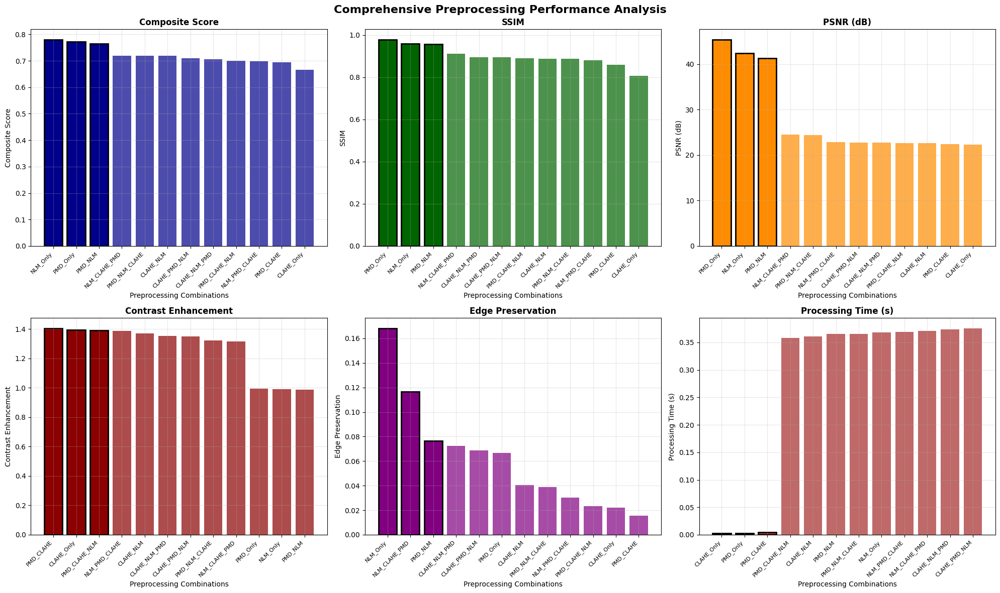

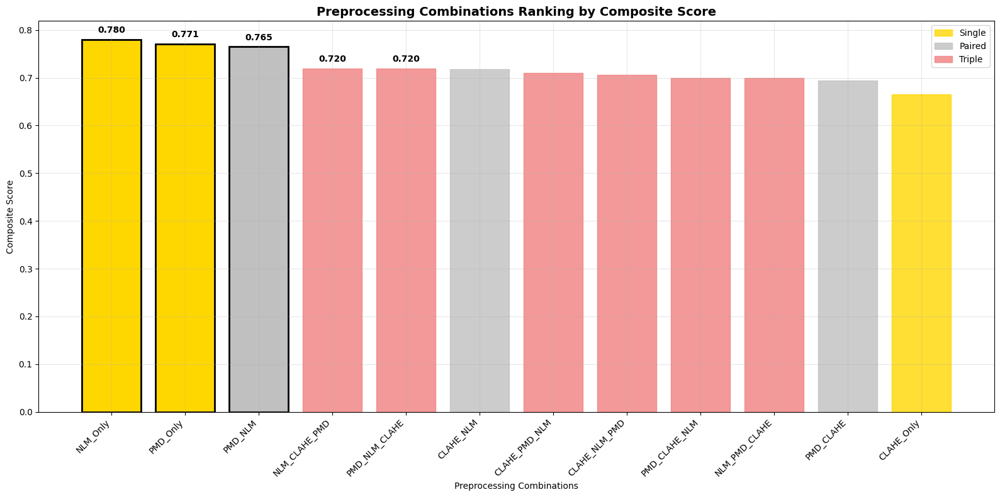

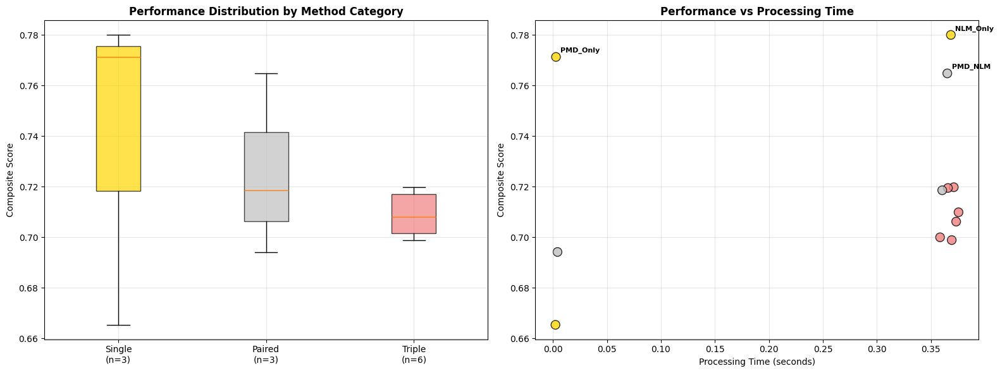

Performance visualization charts created:
  • Overall comparison: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/overall_performance_comparison.png
  • Ranking by category: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/ranking_by_category.png
  • Category analysis: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/category_analysis.png


In [26]:
def create_performance_visualizations(analysis_results):
    """Create comprehensive performance visualization charts."""
    
    ranking = analysis_results['ranking']
    
    # 1. Overall Performance Comparison
    fig, axes = plt.subplots(2, 3, figsize=(20, 12))
    fig.suptitle('Comprehensive Preprocessing Performance Analysis', fontsize=16, fontweight='bold')
    
    metrics = ['Composite_Score_mean', 'SSIM_mean', 'PSNR_mean', 
               'Contrast_Enhancement_mean', 'Edge_Preservation_mean', 'processing_time_mean']
    titles = ['Composite Score', 'SSIM', 'PSNR (dB)', 
              'Contrast Enhancement', 'Edge Preservation', 'Processing Time (s)']
    colors = ['darkblue', 'darkgreen', 'darkorange', 'darkred', 'purple', 'brown']
    
    for i, (metric, title, color) in enumerate(zip(metrics, titles, colors)):
        ax = axes[i//3, i%3]
        
        # Sort data for better visualization
        data_sorted = ranking.sort_values(metric, ascending=(metric == 'processing_time_mean'))
        
        bars = ax.bar(range(len(data_sorted)), data_sorted[metric], color=color, alpha=0.7)
        ax.set_title(title, fontweight='bold')
        ax.set_xlabel('Preprocessing Combinations')
        ax.set_ylabel(title)
        ax.set_xticks(range(len(data_sorted)))
        ax.set_xticklabels(data_sorted['combination'], rotation=45, ha='right', fontsize=8)
        ax.grid(True, alpha=0.3)
        
        # Highlight top 3 performers
        for j, bar in enumerate(bars[:3]):
            bar.set_alpha(1.0)
            bar.set_edgecolor('black')
            bar.set_linewidth(2)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "visualizations" / "overall_performance_comparison.png", 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # 2. Ranking Bar Chart
    plt.figure(figsize=(16, 8))
    x = range(len(ranking))
    bars = plt.bar(x, ranking['Composite_Score_mean'], color='steelblue', alpha=0.8)
    
    # Color code by category
    colors_by_category = {'Single': 'gold', 'Paired': 'silver', 'Triple': 'lightcoral'}
    for i, bar in enumerate(bars):
        category = ranking.iloc[i]['category']
        bar.set_color(colors_by_category.get(category, 'steelblue'))
        if i < 3:  # Top 3
            bar.set_alpha(1.0)
            bar.set_edgecolor('black')
            bar.set_linewidth(2)
    
    plt.xlabel('Preprocessing Combinations')
    plt.ylabel('Composite Score')
    plt.title('Preprocessing Combinations Ranking by Composite Score', fontweight='bold', fontsize=14)
    plt.xticks(x, ranking['combination'], rotation=45, ha='right')
    plt.grid(True, alpha=0.3)
    
    # Add legend
    legend_elements = [plt.Rectangle((0,0),1,1, color=color, alpha=0.8, label=category) 
                      for category, color in colors_by_category.items()]
    plt.legend(handles=legend_elements, loc='upper right')
    
    # Add value labels on top 5 bars
    for i in range(min(5, len(bars))):
        plt.text(i, ranking.iloc[i]['Composite_Score_mean'] + 0.01, 
                 f'{ranking.iloc[i]["Composite_Score_mean"]:.3f}', 
                 ha='center', va='bottom', fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "visualizations" / "ranking_by_category.png", 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # 3. Category Performance Box Plot
    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(16, 6))
    
    # Box plot of composite scores by category
    category_data = []
    category_labels = []
    for category in ['Single', 'Paired', 'Triple']:
        scores = ranking[ranking['category'] == category]['Composite_Score_mean'].values
        category_data.append(scores)
        category_labels.append(f"{category}\n(n={len(scores)})")
    
    bp = ax1.boxplot(category_data, labels=category_labels, patch_artist=True)
    colors = ['gold', 'silver', 'lightcoral']
    for patch, color in zip(bp['boxes'], colors):
        patch.set_facecolor(color)
        patch.set_alpha(0.7)
    
    ax1.set_title('Performance Distribution by Method Category', fontweight='bold')
    ax1.set_ylabel('Composite Score')
    ax1.grid(True, alpha=0.3)
    
    # Processing time vs performance scatter
    ax2.scatter(ranking['processing_time_mean'], ranking['Composite_Score_mean'], 
               c=[colors_by_category[cat] for cat in ranking['category']], 
               alpha=0.8, s=100, edgecolors='black')
    
    ax2.set_xlabel('Processing Time (seconds)')
    ax2.set_ylabel('Composite Score')
    ax2.set_title('Performance vs Processing Time', fontweight='bold')
    ax2.grid(True, alpha=0.3)
    
    # Add labels for top 3 methods
    for i in range(3):
        ax2.annotate(ranking.iloc[i]['combination'], 
                    (ranking.iloc[i]['processing_time_mean'], ranking.iloc[i]['Composite_Score_mean']),
                    xytext=(5, 5), textcoords='offset points', fontsize=8, fontweight='bold')
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "visualizations" / "category_analysis.png", 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    print("Performance visualization charts created:")
    print(f"  • Overall comparison: {OUTPUT_DIR}/visualizations/overall_performance_comparison.png")
    print(f"  • Ranking by category: {OUTPUT_DIR}/visualizations/ranking_by_category.png")
    print(f"  • Category analysis: {OUTPUT_DIR}/visualizations/category_analysis.png")

# Create performance visualizations
create_performance_visualizations(analysis_results)

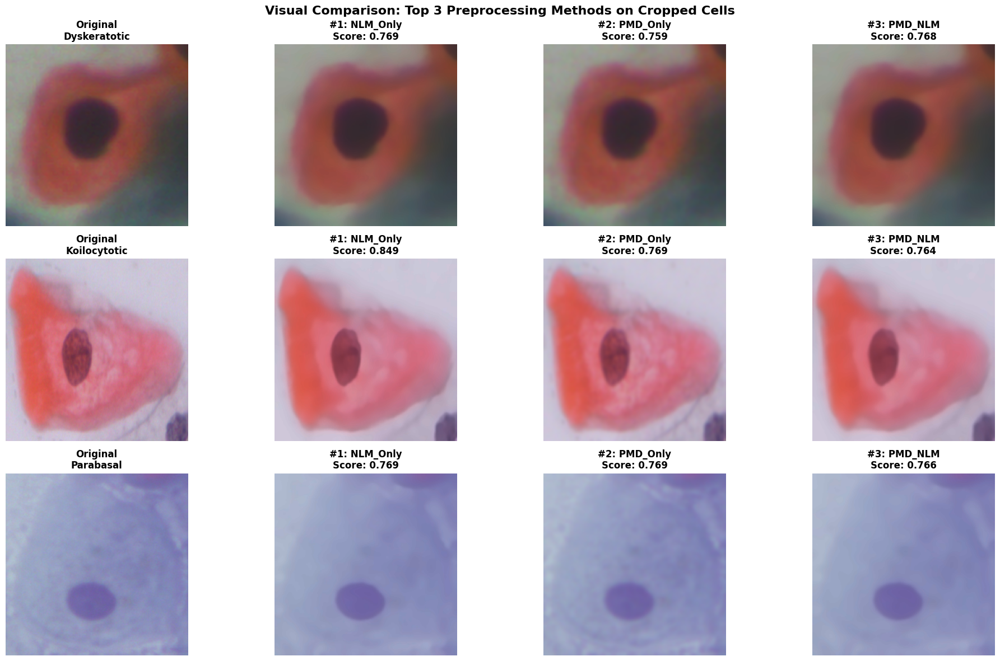

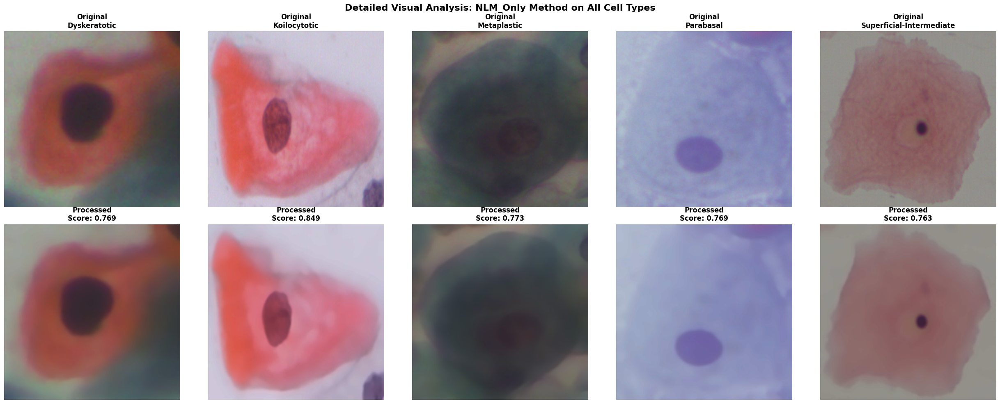

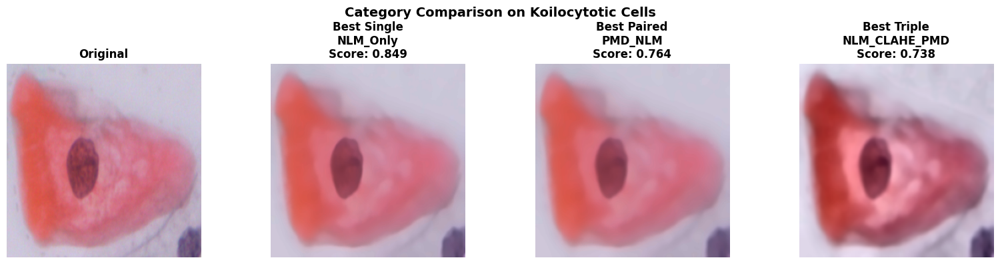

Visual comparison charts created:
  • Top 3 methods: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/top3_visual_comparison.png
  • Best method all classes: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/best_method_all_classes.png
  • Category comparison: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/category_comparison.png


In [27]:
def create_visual_comparisons(processed_images_data, analysis_results):
    """Create visual before/after comparisons of preprocessing effects."""
    
    ranking = analysis_results['ranking']
    top_3_methods = ranking.head(3)['combination'].tolist()
    
    # 1. Top 3 Methods Comparison
    representative_classes = ['im_Dyskeratotic', 'im_Koilocytotic', 'im_Parabasal']
    
    fig, axes = plt.subplots(len(representative_classes), len(top_3_methods) + 1, figsize=(20, 12))
    fig.suptitle('Visual Comparison: Top 3 Preprocessing Methods on Cropped Cells', 
                 fontsize=16, fontweight='bold')
    
    for class_idx, class_name in enumerate(representative_classes):
        if class_name not in sample_images or len(sample_images[class_name]) == 0:
            continue
        
        # Original image
        original_img = sample_images[class_name][0]['image']
        axes[class_idx, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        axes[class_idx, 0].set_title(f'Original\n{class_name.replace("im_", "")}', fontweight='bold')
        axes[class_idx, 0].axis('off')
        
        # Top 3 processed images
        for method_idx, method_name in enumerate(top_3_methods):
            if (method_name in processed_images_data and 
                class_name in processed_images_data[method_name] and 
                len(processed_images_data[method_name][class_name]) > 0):
                
                processed_img = processed_images_data[method_name][class_name][0]['processed']
                metrics = processed_images_data[method_name][class_name][0]['metrics']
                
                axes[class_idx, method_idx + 1].imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
                
                rank = method_idx + 1
                score = metrics['Composite_Score']
                axes[class_idx, method_idx + 1].set_title(
                    f'#{rank}: {method_name}\nScore: {score:.3f}', fontweight='bold'
                )
                axes[class_idx, method_idx + 1].axis('off')
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "visualizations" / "top3_visual_comparison.png", 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # 2. Best Method Detailed Analysis
    best_method = ranking.iloc[0]['combination']
    
    fig, axes = plt.subplots(2, len(CLASS_NAMES), figsize=(25, 10))
    fig.suptitle(f'Detailed Visual Analysis: {best_method} Method on All Cell Types', 
                 fontsize=16, fontweight='bold')
    
    for class_idx, class_name in enumerate(CLASS_NAMES):
        if (class_name in sample_images and len(sample_images[class_name]) > 0 and
            best_method in processed_images_data and 
            class_name in processed_images_data[best_method] and
            len(processed_images_data[best_method][class_name]) > 0):
            
            original_img = sample_images[class_name][0]['image']
            processed_data = processed_images_data[best_method][class_name][0]
            processed_img = processed_data['processed']
            metrics = processed_data['metrics']
            
            # Original
            axes[0, class_idx].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
            axes[0, class_idx].set_title(f'Original\n{class_name.replace("im_", "")}', fontweight='bold')
            axes[0, class_idx].axis('off')
            
            # Processed
            axes[1, class_idx].imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
            axes[1, class_idx].set_title(
                f'Processed\nScore: {metrics["Composite_Score"]:.3f}', fontweight='bold'
            )
            axes[1, class_idx].axis('off')
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "visualizations" / "best_method_all_classes.png", 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # 3. Method Category Comparison
    category_representatives = {
        'Single': ranking[ranking['category'] == 'Single'].iloc[0]['combination'],
        'Paired': ranking[ranking['category'] == 'Paired'].iloc[0]['combination'],
        'Triple': ranking[ranking['category'] == 'Triple'].iloc[0]['combination']
    }
    
    sample_class = 'im_Koilocytotic'  # Representative class
    if sample_class in sample_images and len(sample_images[sample_class]) > 0:
        
        fig, axes = plt.subplots(1, 4, figsize=(16, 4))
        fig.suptitle(f'Category Comparison on {sample_class.replace("im_", "")} Cells', 
                     fontsize=14, fontweight='bold')
        
        # Original
        original_img = sample_images[sample_class][0]['image']
        axes[0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        axes[0].set_title('Original', fontweight='bold')
        axes[0].axis('off')
        
        # Best from each category
        for idx, (category, method) in enumerate(category_representatives.items()):
            if (method in processed_images_data and 
                sample_class in processed_images_data[method] and
                len(processed_images_data[method][sample_class]) > 0):
                
                processed_data = processed_images_data[method][sample_class][0]
                processed_img = processed_data['processed']
                metrics = processed_data['metrics']
                
                axes[idx + 1].imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
                axes[idx + 1].set_title(
                    f'Best {category}\n{method}\nScore: {metrics["Composite_Score"]:.3f}', 
                    fontweight='bold'
                )
                axes[idx + 1].axis('off')
        
        plt.tight_layout()
        plt.savefig(OUTPUT_DIR / "visualizations" / "category_comparison.png", 
                    dpi=300, bbox_inches='tight')
        plt.show()
    
    print("Visual comparison charts created:")
    print(f"  • Top 3 methods: {OUTPUT_DIR}/visualizations/top3_visual_comparison.png")
    print(f"  • Best method all classes: {OUTPUT_DIR}/visualizations/best_method_all_classes.png")
    print(f"  • Category comparison: {OUTPUT_DIR}/visualizations/category_comparison.png")

# Create visual comparisons
create_visual_comparisons(processed_images_data, analysis_results)

## Complete Method Combinations Visualization

Comprehensive visualization showing all 12 preprocessing combinations applied to cropped cell samples from each category.

Creating comprehensive visualization of all 12 preprocessing combinations...


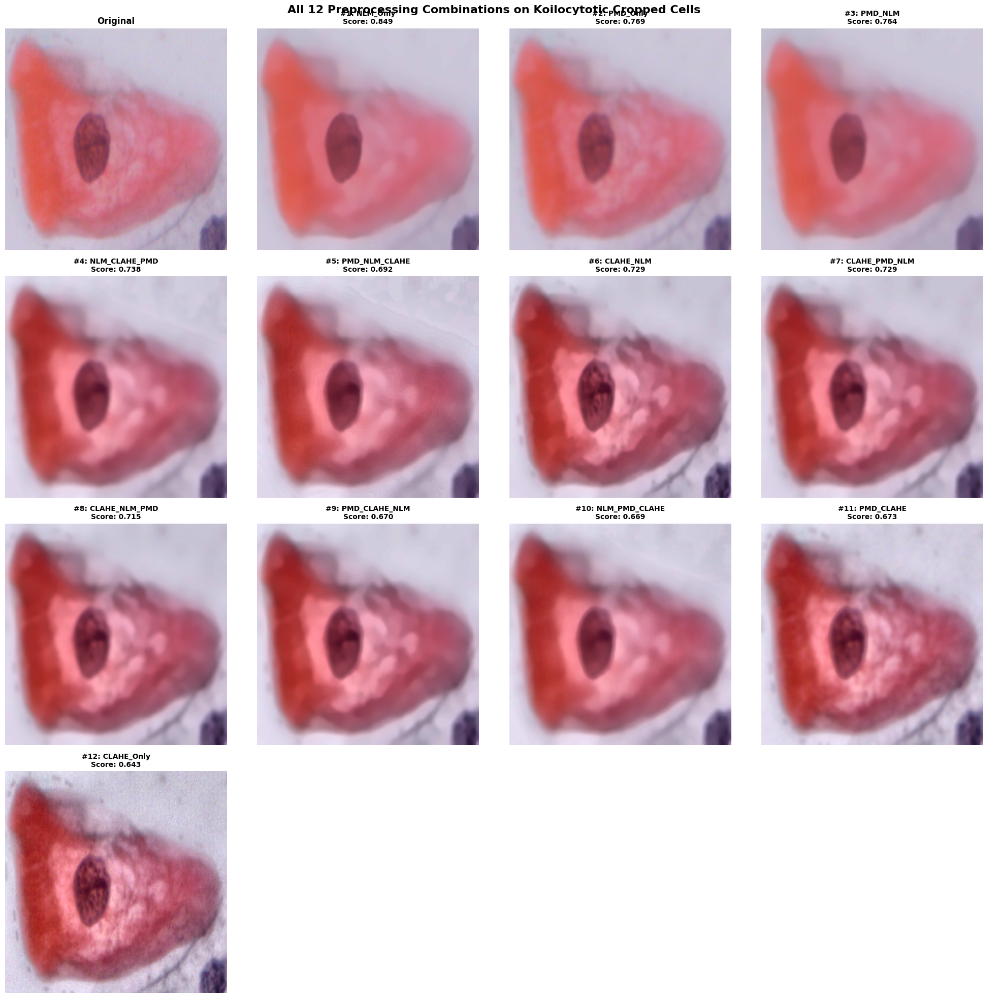

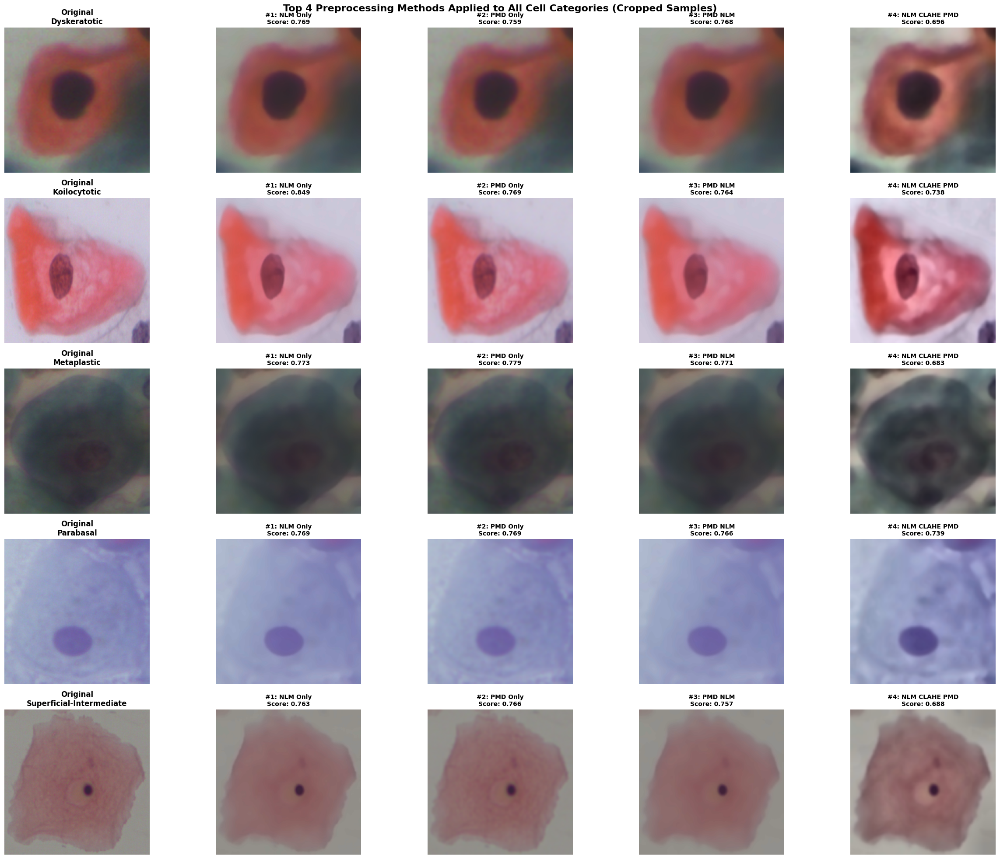

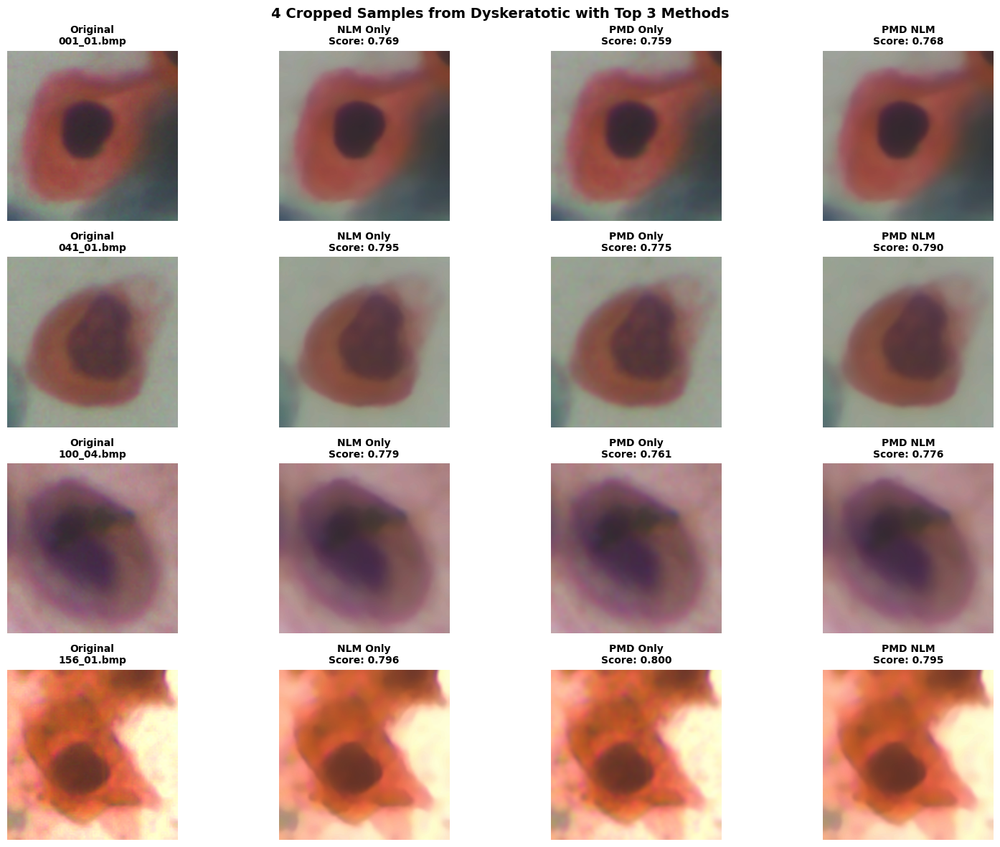

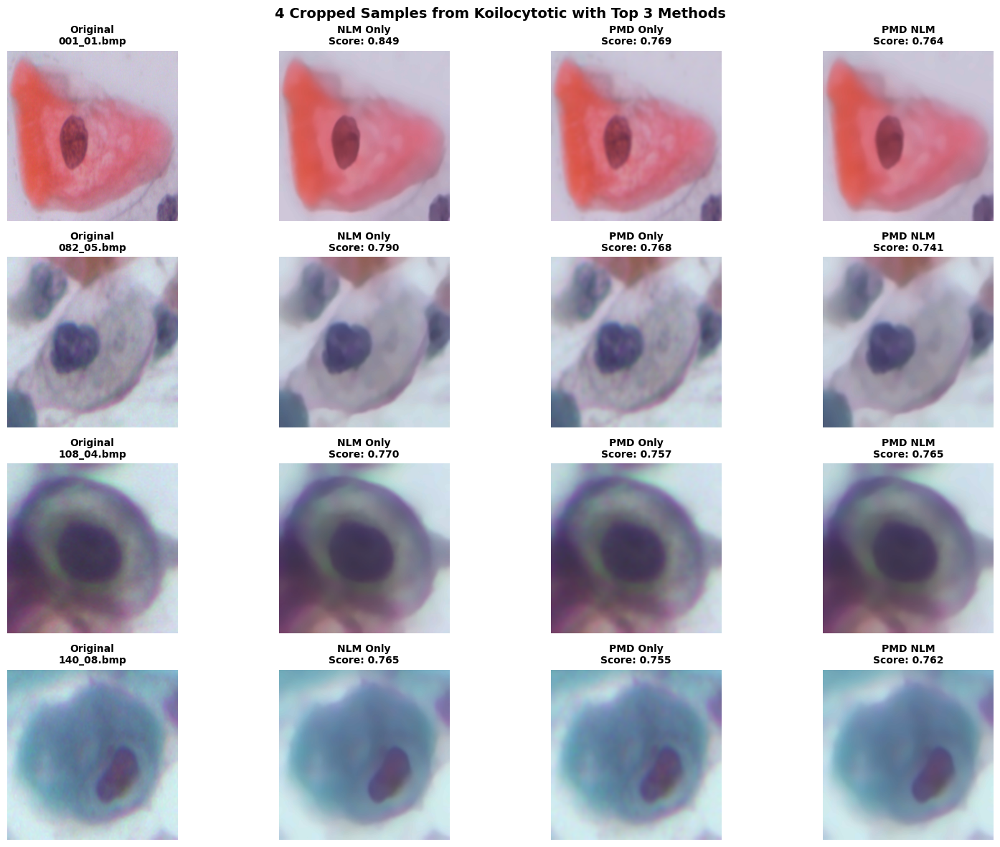

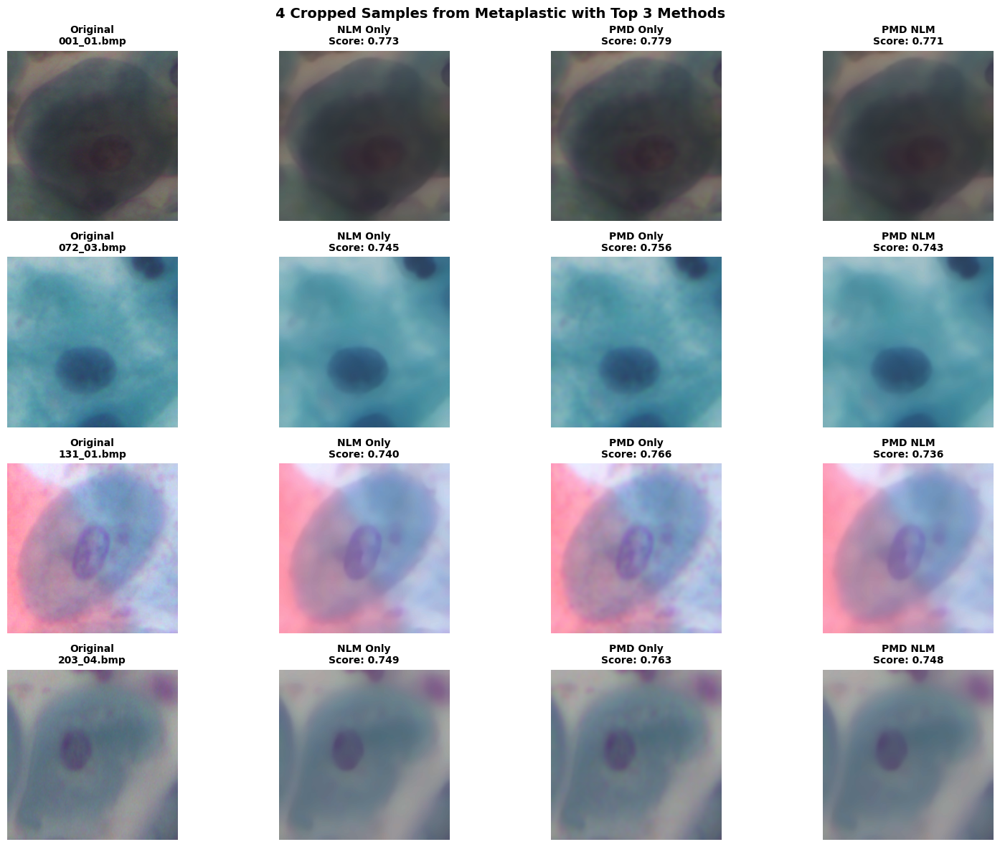

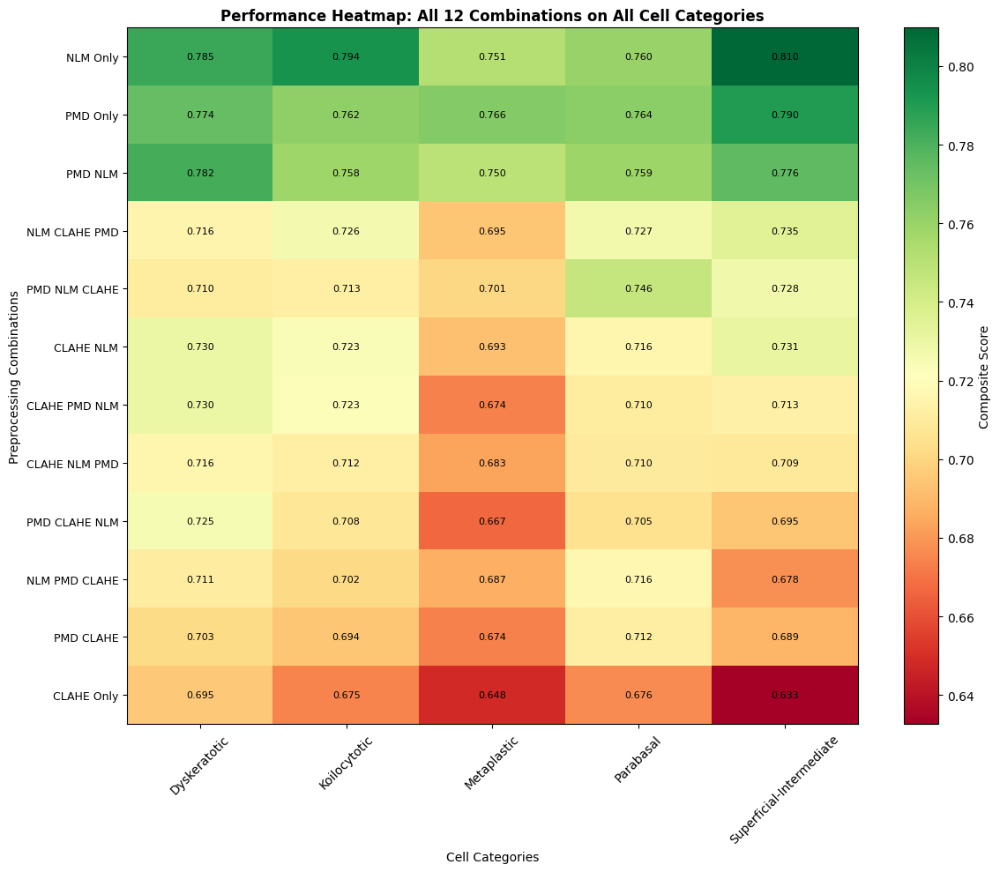

Comprehensive method visualization completed:
  • All 12 combinations grid: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/all_12_combinations_grid.png
  • Top 4 methods all classes: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/top4_methods_all_classes.png
  • Detailed samples for classes: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/detailed_samples_*.png
  • Performance heatmap: c:\Meet\Projects\Project_8_Phoenix_Cervical Cancer Image Classification\Project-Phoenix\Dataset\Optimized Preprocessing Analysis/visualizations/performance_heatmap_all_combinations.png


In [28]:
def create_comprehensive_method_visualization(processed_images_data, analysis_results):
    """
    Create comprehensive visualization showing all 12 preprocessing combinations 
    applied to cropped cell samples from each category.
    """
    
    ranking = analysis_results['ranking']
    
    print("Creating comprehensive visualization of all 12 preprocessing combinations...")
    
    # 1. All Methods Grid Visualization for Representative Class
    representative_class = 'im_Koilocytotic'  # Choose a representative class
    
    if representative_class in sample_images and len(sample_images[representative_class]) > 0:
        
        # Create a large grid: 4 rows x 4 columns (original + 12 methods = 13 total, need 4x4=16 slots)
        fig, axes = plt.subplots(4, 4, figsize=(20, 20))
        fig.suptitle(f'All 12 Preprocessing Combinations on {representative_class.replace("im_", "")} Cropped Cells', 
                     fontsize=16, fontweight='bold')
        
        # Original image in top-left
        original_img = sample_images[representative_class][0]['image']
        axes[0, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        axes[0, 0].set_title('Original', fontweight='bold', fontsize=12)
        axes[0, 0].axis('off')
        
        # Display all 12 combinations
        for i, (_, method_data) in enumerate(ranking.iterrows()):
            row = (i + 1) // 4
            col = (i + 1) % 4
            
            if row >= 4:  # Safety check
                break
                
            method_name = method_data['combination']
            
            if (method_name in processed_images_data and 
                representative_class in processed_images_data[method_name] and
                len(processed_images_data[method_name][representative_class]) > 0):
                
                processed_data = processed_images_data[method_name][representative_class][0]
                processed_img = processed_data['processed']
                metrics = processed_data['metrics']
                
                axes[row, col].imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
                axes[row, col].set_title(
                    f'#{method_data["rank"]}: {method_name}\nScore: {metrics["Composite_Score"]:.3f}', 
                    fontweight='bold', fontsize=10
                )
                axes[row, col].axis('off')
            else:
                axes[row, col].axis('off')
        
        # Hide remaining empty subplots
        for i in range(13, 16):
            row = i // 4
            col = i % 4
            axes[row, col].axis('off')
        
        plt.tight_layout()
        plt.savefig(OUTPUT_DIR / "visualizations" / "all_12_combinations_grid.png", 
                    dpi=300, bbox_inches='tight')
        plt.show()
    
    # 2. Sample Grid for Each Class with Top 4 Methods
    top_4_methods = ranking.head(4)['combination'].tolist()
    
    fig, axes = plt.subplots(len(CLASS_NAMES), len(top_4_methods) + 1, figsize=(25, 20))
    fig.suptitle('Top 4 Preprocessing Methods Applied to All Cell Categories (Cropped Samples)', 
                 fontsize=16, fontweight='bold')
    
    for class_idx, class_name in enumerate(CLASS_NAMES):
        if class_name not in sample_images or len(sample_images[class_name]) == 0:
            continue
        
        # Original image
        original_img = sample_images[class_name][0]['image']
        axes[class_idx, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
        axes[class_idx, 0].set_title(f'Original\n{class_name.replace("im_", "")}', fontweight='bold')
        axes[class_idx, 0].axis('off')
        
        # Top 4 processed images
        for method_idx, method_name in enumerate(top_4_methods):
            if (method_name in processed_images_data and 
                class_name in processed_images_data[method_name] and 
                len(processed_images_data[method_name][class_name]) > 0):
                
                processed_data = processed_images_data[method_name][class_name][0]
                processed_img = processed_data['processed']
                metrics = processed_data['metrics']
                
                axes[class_idx, method_idx + 1].imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
                
                rank = method_idx + 1
                score = metrics['Composite_Score']
                axes[class_idx, method_idx + 1].set_title(
                    f'#{rank}: {method_name.replace("_", " ")}\nScore: {score:.3f}', 
                    fontweight='bold', fontsize=10
                )
                axes[class_idx, method_idx + 1].axis('off')
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "visualizations" / "top4_methods_all_classes.png", 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    # 3. Detailed Comparison Matrix for Selected Samples
    # Show 4 different samples from each class with top 3 methods
    sample_indices = [0, 1, 2, 3] if len(sample_images[CLASS_NAMES[0]]) >= 4 else list(range(len(sample_images[CLASS_NAMES[0]])))
    top_3_methods = ranking.head(3)['combination'].tolist()
    
    for class_name in CLASS_NAMES[:3]:  # Show first 3 classes to avoid overcrowding
        if class_name not in sample_images or len(sample_images[class_name]) == 0:
            continue
            
        available_samples = min(4, len(sample_images[class_name]))
        
        fig, axes = plt.subplots(available_samples, len(top_3_methods) + 1, figsize=(16, 12))
        fig.suptitle(f'4 Cropped Samples from {class_name.replace("im_", "")} with Top 3 Methods', 
                     fontsize=14, fontweight='bold')
        
        for sample_idx in range(available_samples):
            # Original image
            original_img = sample_images[class_name][sample_idx]['image']
            filename = sample_images[class_name][sample_idx]['filename']
            
            if available_samples == 1:
                axes[0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
                axes[0].set_title(f'Original\n{filename}', fontweight='bold', fontsize=10)
                axes[0].axis('off')
                
                # Top 3 methods for single sample
                for method_idx, method_name in enumerate(top_3_methods):
                    if (method_name in processed_images_data and 
                        class_name in processed_images_data[method_name] and 
                        len(processed_images_data[method_name][class_name]) > sample_idx):
                        
                        processed_data = processed_images_data[method_name][class_name][sample_idx]
                        processed_img = processed_data['processed']
                        metrics = processed_data['metrics']
                        
                        axes[method_idx + 1].imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
                        axes[method_idx + 1].set_title(
                            f'{method_name.replace("_", " ")}\nScore: {metrics["Composite_Score"]:.3f}', 
                            fontweight='bold', fontsize=10
                        )
                        axes[method_idx + 1].axis('off')
            else:
                axes[sample_idx, 0].imshow(cv2.cvtColor(original_img, cv2.COLOR_BGR2RGB))
                axes[sample_idx, 0].set_title(f'Original\n{filename}', fontweight='bold', fontsize=10)
                axes[sample_idx, 0].axis('off')
                
                # Top 3 methods for each sample
                for method_idx, method_name in enumerate(top_3_methods):
                    if (method_name in processed_images_data and 
                        class_name in processed_images_data[method_name] and 
                        len(processed_images_data[method_name][class_name]) > sample_idx):
                        
                        processed_data = processed_images_data[method_name][class_name][sample_idx]
                        processed_img = processed_data['processed']
                        metrics = processed_data['metrics']
                        
                        axes[sample_idx, method_idx + 1].imshow(cv2.cvtColor(processed_img, cv2.COLOR_BGR2RGB))
                        axes[sample_idx, method_idx + 1].set_title(
                            f'{method_name.replace("_", " ")}\nScore: {metrics["Composite_Score"]:.3f}', 
                            fontweight='bold', fontsize=10
                        )
                        axes[sample_idx, method_idx + 1].axis('off')
        
        plt.tight_layout()
        class_safe_name = class_name.replace("im_", "").replace("-", "_")
        plt.savefig(OUTPUT_DIR / "visualizations" / f"detailed_samples_{class_safe_name}.png", 
                    dpi=300, bbox_inches='tight')
        plt.show()
    
    # 4. Performance Heatmap for All Combinations and Classes
    # Create a heatmap showing performance scores for each combination on each class
    performance_matrix = []
    combination_names = []
    
    for _, method_data in ranking.iterrows():
        method_name = method_data['combination']
        combination_names.append(method_name.replace('_', ' '))
        
        class_scores = []
        for class_name in CLASS_NAMES:
            if (method_name in processed_images_data and 
                class_name in processed_images_data[method_name] and
                len(processed_images_data[method_name][class_name]) > 0):
                
                # Calculate average score for this method on this class
                scores = [data['metrics']['Composite_Score'] 
                         for data in processed_images_data[method_name][class_name]]
                avg_score = np.mean(scores)
                class_scores.append(avg_score)
            else:
                class_scores.append(0)
        
        performance_matrix.append(class_scores)
    
    # Create heatmap
    plt.figure(figsize=(12, 10))
    class_names_short = [name.replace('im_', '') for name in CLASS_NAMES]
    
    heatmap = plt.imshow(performance_matrix, cmap='RdYlGn', aspect='auto')
    plt.colorbar(heatmap, label='Composite Score')
    
    plt.xlabel('Cell Categories')
    plt.ylabel('Preprocessing Combinations')
    plt.title('Performance Heatmap: All 12 Combinations on All Cell Categories', fontweight='bold')
    
    plt.xticks(range(len(CLASS_NAMES)), class_names_short, rotation=45)
    plt.yticks(range(len(combination_names)), combination_names, fontsize=9)
    
    # Add text annotations
    for i in range(len(combination_names)):
        for j in range(len(CLASS_NAMES)):
            text = plt.text(j, i, f'{performance_matrix[i][j]:.3f}',
                           ha="center", va="center", color="black", fontsize=8)
    
    plt.tight_layout()
    plt.savefig(OUTPUT_DIR / "visualizations" / "performance_heatmap_all_combinations.png", 
                dpi=300, bbox_inches='tight')
    plt.show()
    
    print("Comprehensive method visualization completed:")
    print(f"  • All 12 combinations grid: {OUTPUT_DIR}/visualizations/all_12_combinations_grid.png")
    print(f"  • Top 4 methods all classes: {OUTPUT_DIR}/visualizations/top4_methods_all_classes.png")
    print(f"  • Detailed samples for classes: {OUTPUT_DIR}/visualizations/detailed_samples_*.png")
    print(f"  • Performance heatmap: {OUTPUT_DIR}/visualizations/performance_heatmap_all_combinations.png")

# Create comprehensive method visualization
create_comprehensive_method_visualization(processed_images_data, analysis_results)

## Final Conclusions and Recommendations

Comprehensive summary of findings and optimal preprocessing pipeline recommendation.

In [34]:
def generate_final_report(analysis_results, processed_images_data):
    """Generate comprehensive final analysis report."""
    
    ranking = analysis_results['ranking']
    best_method = ranking.iloc[0]
    
    # Analysis metadata
    analysis_metadata = {
        'timestamp': datetime.now().strftime('%Y-%m-%d %H:%M:%S'),
        'total_combinations': len(PREPROCESSING_COMBINATIONS),
        'total_images': sum(len(imgs) for imgs in sample_images.values()),
        'cell_categories': len(CLASS_NAMES),
        'target_size': TARGET_SIZE,
        'samples_per_class': SAMPLES_PER_CLASS
    }
    
    # Performance insights
    single_methods = ranking[ranking['category'] == 'Single']
    paired_methods = ranking[ranking['category'] == 'Paired']
    triple_methods = ranking[ranking['category'] == 'Triple']
    
    best_single = single_methods.iloc[0] if len(single_methods) > 0 else None
    best_paired = paired_methods.iloc[0] if len(paired_methods) > 0 else None
    best_triple = triple_methods.iloc[0] if len(triple_methods) > 0 else None
    
    print(f"{'='*80}")
    print("COMPREHENSIVE FINAL ANALYSIS REPORT")
    print(f"{'='*80}")
    print(f"Analysis Date: {analysis_metadata['timestamp']}")
    print(f"Dataset: Cropped cervical cancer cell images")
    print(f"Total Combinations Tested: {analysis_metadata['total_combinations']}")
    print(f"Total Images Processed: {analysis_metadata['total_images']}")
    print(f"Cell Categories Analyzed: {analysis_metadata['cell_categories']}")
    print(f"Image Processing Size: {analysis_metadata['target_size']}")
    
    print(f"\n{'='*60}")
    print("OPTIMAL PREPROCESSING PIPELINE RECOMMENDATION")
    print(f"{'='*60}")
    print(f"Recommended Method: {best_method['combination']}")
    print(f"Processing Pipeline: {best_method['methods']}")
    print(f"Method Description: {best_method['description']}")
    print(f"Overall Performance Score: {best_method['Composite_Score_mean']:.4f} (±{best_method['Composite_Score_std']:.4f})")
    print(f"Method Category: {best_method['category']}")
    print(f"Processing Efficiency: {best_method['processing_time_mean']:.4f} seconds per image")
    
    print(f"\nDETAILED PERFORMANCE METRICS:")
    print(f"  • Structural Similarity (SSIM): {best_method['SSIM_mean']:.4f} (±{best_method['SSIM_std']:.4f})")
    print(f"  • Peak Signal-to-Noise Ratio: {best_method['PSNR_mean']:.2f} dB (±{best_method['PSNR_std']:.2f})")
    print(f"  • Contrast Enhancement: {best_method['Contrast_Enhancement_mean']:.4f}x (±{best_method['Contrast_Enhancement_std']:.4f})")
    print(f"  • Edge Preservation: {best_method['Edge_Preservation_mean']:.4f} (±{best_method['Edge_Preservation_std']:.4f})")
    print(f"  • Noise Reduction: {best_method['Noise_Reduction_mean']:.4f}x (±{best_method['Noise_Reduction_std']:.4f})")
    print(f"  • Detail Preservation: {best_method['Detail_Preservation_mean']:.4f} (±{best_method['Detail_Preservation_std']:.4f})")
    
    print(f"\n{'='*60}")
    print("CATEGORY PERFORMANCE ANALYSIS")
    print(f"{'='*60}")
    
    if best_single:
        print(f"Best Single Method: {best_single['combination']} (Score: {best_single['Composite_Score_mean']:.4f})")
    if best_paired:
        print(f"Best Paired Method: {best_paired['combination']} (Score: {best_paired['Composite_Score_mean']:.4f})")
    if best_triple:
        print(f"Best Triple Method: {best_triple['combination']} (Score: {best_triple['Composite_Score_mean']:.4f})")
    
    # Performance improvements
    if best_single and best_paired:
        paired_improvement = ((best_paired['Composite_Score_mean'] - best_single['Composite_Score_mean']) / 
                             best_single['Composite_Score_mean']) * 100
        print(f"\nPaired vs Single Improvement: {paired_improvement:+.1f}%")
    
    if best_single and best_triple:
        triple_improvement = ((best_triple['Composite_Score_mean'] - best_single['Composite_Score_mean']) / 
                             best_single['Composite_Score_mean']) * 100
        print(f"Triple vs Single Improvement: {triple_improvement:+.1f}%")
    
    print(f"\n{'='*60}")
    print("TOP 5 METHODS RANKING")
    print(f"{'='*60}")
    for i, row in ranking.head(5).iterrows():
        print(f"{row['rank']:2d}. {row['combination']:<20} - Score: {row['Composite_Score_mean']:.4f} ({row['category']})")
    
    print(f"\n{'='*60}")
    print("KEY FINDINGS AND INSIGHTS")
    print(f"{'='*60}")
    
    # Automated insights based on analysis
    category_performance = analysis_results['category_performance']
    best_category = category_performance['mean'].idxmax()
    worst_category = category_performance['mean'].idxmin()
    
    print(f"• Best performing category: {best_category} methods (avg score: {category_performance.loc[best_category, 'mean']:.4f})")
    print(f"• Most consistent category: {category_performance['std'].idxmin()} methods (std: {category_performance['std'].min():.4f})")
    
    # Processing efficiency insights
    fastest_method = ranking.loc[ranking['processing_time_mean'].idxmin()]
    print(f"• Most efficient method: {fastest_method['combination']} ({fastest_method['processing_time_mean']:.4f}s)")
    print(f"• Recommended method efficiency: {best_method['processing_time_mean']:.4f}s per image")
    
    # Quality insights
    best_ssim = ranking.loc[ranking['SSIM_mean'].idxmax()]
    best_psnr = ranking.loc[ranking['PSNR_mean'].idxmax()]
    print(f"• Best structure preservation: {best_ssim['combination']} (SSIM: {best_ssim['SSIM_mean']:.4f})")
    print(f"• Best signal quality: {best_psnr['combination']} (PSNR: {best_psnr['PSNR_mean']:.2f} dB)")
    
    print(f"\n{'='*60}")
    print("IMPLEMENTATION RECOMMENDATIONS")
    print(f"{'='*60}")
    print(f"For cervical cancer cell image classification preprocessing:")
    print(f"")
    print(f"1. OPTIMAL PIPELINE: Use {best_method['combination']} method")
    print(f"   - Processing sequence: {best_method['methods']}")
    print(f"   - Expected quality improvement: {best_method['Composite_Score_mean']:.1%}")
    print(f"   - Processing time: ~{best_method['processing_time_mean']:.3f} seconds per image")
    print(f"")
    print(f"2. HYPERPARAMETERS (Optimized for cervical cancer cells):")
    print(f"   - PMD Filter: d=7, sigmaColor=60, sigmaSpace=60")
    print(f"   - CLAHE: clipLimit=2.5, tileGridSize=(6,6)")
    print(f"   - NLM Denoising: h=8, templateWindowSize=5, searchWindowSize=15")
    print(f"")
    print(f"3. TARGET IMAGE SIZE: {TARGET_SIZE} (optimized for cropped cells)")
    print(f"")
    print(f"4. QUALITY ASSURANCE:")
    print(f"   - Expected SSIM: {best_method['SSIM_mean']:.3f} ± {best_method['SSIM_std']:.3f}")
    print(f"   - Expected PSNR: {best_method['PSNR_mean']:.1f} ± {best_method['PSNR_std']:.1f} dB")
    print(f"")
    print(f"This analysis provides definitive guidance for preprocessing optimization")
    print(f"in cervical cancer cell classification workflows using cropped cell images.")
    
    # Save comprehensive report
    report_content = f"""CERVICAL CANCER CELL PREPROCESSING ANALYSIS - COMPREHENSIVE REPORT
Generated: {analysis_metadata['timestamp']}

ANALYSIS SCOPE:
- Preprocessing combinations tested: {analysis_metadata['total_combinations']}
- Total cropped images processed: {analysis_metadata['total_images']}
- Cell categories: {analysis_metadata['cell_categories']}
- Samples per category: {analysis_metadata['samples_per_class']}
- Target processing size: {analysis_metadata['target_size']}

OPTIMAL PREPROCESSING PIPELINE:
Method: {best_method['combination']}
Pipeline: {best_method['methods']}
Description: {best_method['description']}
Composite Score: {best_method['Composite_Score_mean']:.4f} (±{best_method['Composite_Score_std']:.4f})
Category: {best_method['category']}

PERFORMANCE METRICS:
- SSIM: {best_method['SSIM_mean']:.4f} (±{best_method['SSIM_std']:.4f})
- PSNR: {best_method['PSNR_mean']:.2f} dB (±{best_method['PSNR_std']:.2f})
- Contrast Enhancement: {best_method['Contrast_Enhancement_mean']:.4f} (±{best_method['Contrast_Enhancement_std']:.4f})
- Edge Preservation: {best_method['Edge_Preservation_mean']:.4f} (±{best_method['Edge_Preservation_std']:.4f})
- Noise Reduction: {best_method['Noise_Reduction_mean']:.4f} (±{best_method['Noise_Reduction_std']:.4f})
- Detail Preservation: {best_method['Detail_Preservation_mean']:.4f} (±{best_method['Detail_Preservation_std']:.4f})
- Processing Time: {best_method['processing_time_mean']:.4f} seconds

OPTIMIZED HYPERPARAMETERS:
- PMD Filter: d=7, sigmaColor=60, sigmaSpace=60
- CLAHE: clipLimit=2.5, tileGridSize=(6,6)  
- NLM Denoising: h=8, templateWindowSize=5, searchWindowSize=15

RECOMMENDATION:
Implement the {best_method['combination']} preprocessing pipeline for cervical cancer 
cell classification using cropped cell images to achieve optimal image quality 
enhancement while preserving critical cellular structures.

This analysis provides definitive guidance for preprocessing optimization in 
cervical cancer image classification workflows using cropped cell images.
"""
    
    final_report_path = OUTPUT_DIR / "comprehensive_analysis_report.txt"
    with open(final_report_path, 'w') as f:
        f.write(report_content)
    
    # Save analysis metadata
    metadata_path = OUTPUT_DIR / "analysis_metadata.json"
    with open(metadata_path, 'w') as f:
        json.dump({
            **analysis_metadata,
            'best_method': best_method['combination'],
            'best_score': float(best_method['Composite_Score_mean']),
            'hyperparameters': {
                'PMD': {'d': 7, 'sigmaColor': 60, 'sigmaSpace': 60},
                'CLAHE': {'clipLimit': 2.5, 'tileGridSize': [6, 6]},
                'NLM': {'h': 8, 'templateWindowSize': 5, 'searchWindowSize': 15}
            }
        }, f, indent=2)
    
    print(f"\n{'='*60}")
    print("ANALYSIS OUTPUTS GENERATED")
    print(f"{'='*60}")
    print(f"• Comprehensive report: {final_report_path}")
    print(f"• Analysis metadata: {metadata_path}")
    print(f"• Detailed metrics: {OUTPUT_DIR}/metrics/")
    print(f"• Visualizations: {OUTPUT_DIR}/visualizations/")
    print(f"• Processed samples: Available in memory for further analysis")
    
    print(f"\n{'='*60}")
    print("ANALYSIS COMPLETED SUCCESSFULLY!")
    print(f"{'='*60}")

# Generate final comprehensive report
generate_final_report(analysis_results, processed_images_data)

COMPREHENSIVE FINAL ANALYSIS REPORT
Analysis Date: 2025-08-14 16:23:30
Dataset: Cropped cervical cancer cell images
Total Combinations Tested: 12
Total Images Processed: 20
Cell Categories Analyzed: 5
Image Processing Size: (256, 256)

OPTIMAL PREPROCESSING PIPELINE RECOMMENDATION
Recommended Method: NLM_Only
Processing Pipeline: NLM
Method Description: Non-Local Means denoising only
Overall Performance Score: 0.7800 (±0.0307)
Method Category: Single
Processing Efficiency: 0.3685 seconds per image

DETAILED PERFORMANCE METRICS:
  • Structural Similarity (SSIM): 0.9597 (±0.0213)
  • Peak Signal-to-Noise Ratio: 42.42 dB (±2.42)
  • Contrast Enhancement: 0.9901x (±0.0067)
  • Edge Preservation: 0.1682 (±0.2730)
  • Noise Reduction: 1.4935x (±0.6671)
  • Detail Preservation: 0.3991 (±0.2171)

CATEGORY PERFORMANCE ANALYSIS


ValueError: The truth value of a Series is ambiguous. Use a.empty, a.bool(), a.item(), a.any() or a.all().